In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")


In [ ]:
data = pd.read_csv("/data.csv")
genre_data = pd.read_csv("/data_by_genres.csv")
year_data = pd.read_csv("/data_by_year.csv")

In [ ]:
print(data.head())
print(genre_data.head())
print(year_data.head())

   valence  year  acousticness  \
0   0.0594  1921         0.982   
1   0.9630  1921         0.732   
2   0.0394  1921         0.961   
3   0.1650  1921         0.967   
4   0.2530  1921         0.957   

                                             artists  danceability  \
0  ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                     ['Dennis Day']         0.819   
2  ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                   ['Frank Parker']         0.275   
4                                     ['Phil Regan']         0.418   

   duration_ms  energy  explicit                      id  instrumentalness  \
0       831667   0.211         0  4BJqT0PrAfrxzMOxytFOIz          0.878000   
1       180533   0.341         0  7xPhfUan2yNtyFG0cUWkt8          0.000000   
2       500062   0.166         0  1o6I8BglA6ylDMrIELygv1          0.913000   
3       210000   0.309         0  3ftBPsC5vPBKxYSee08FDH      

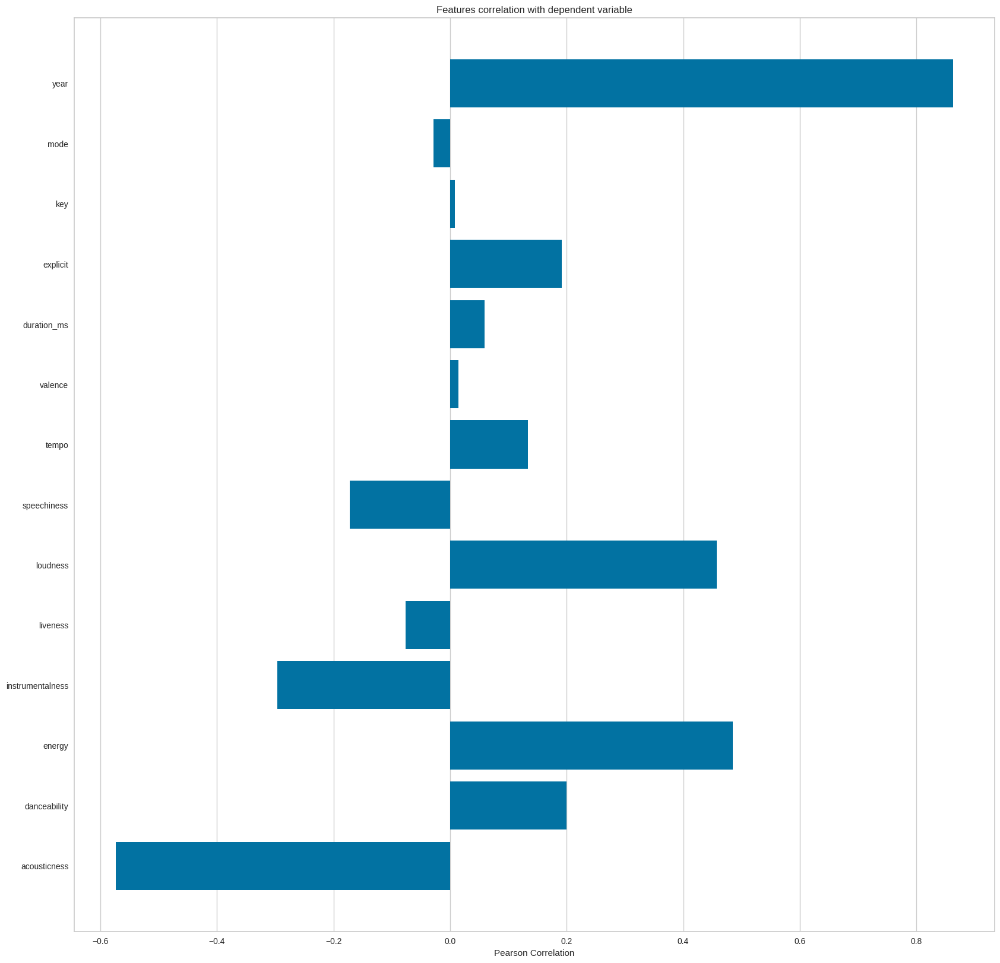

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()


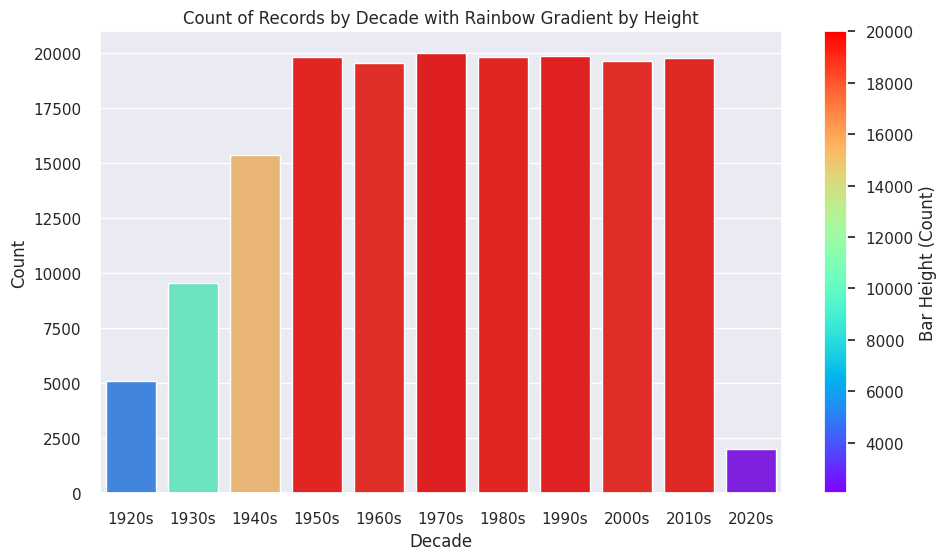

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)
# Count the occurrences of each decade
decade_counts = data['decade'].value_counts().sort_index()

# Normalize the heights (counts) to use as indices for the rainbow palette
norm = plt.Normalize(decade_counts.values.min(), decade_counts.values.max())
sm = plt.cm.ScalarMappable(cmap="rainbow", norm=norm)
sm.set_array([])

# Apply the colors based on the normalized heights
colors = sm.to_rgba(decade_counts.values)

# Plotting with the custom colors
sns.set(rc={'figure.figsize':(11, 6)})
sns.barplot(x=decade_counts.index, y=decade_counts.values, palette=colors)

# Add color bar for reference
plt.colorbar(sm, label='Bar Height (Count)')

plt.title('Count of Records by Decade with Rainbow Gradient by Height')
plt.xlabel('Decade')
plt.ylabel('Count')

plt.show()


In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.589s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.102585
[t-SNE] KL divergence after 1000 iterations: 1.393157


In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
!pip install spotipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.6/255.6 kB 1.8 MB/s eta 0:00:00


In [29]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

# '337ffb0e1efc4f7f9c2243a01c0bf9aa'  # Replace with your Client ID
SPOTIFY_CLIENT_SECRET = 'd3b41a6575c641e28e146ed97a084ea7'
SPOTIFY_CLIENT_ID = '337ffb0e1efc4f7f9c2243a01c0bf9aa'


In [33]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import pandas as pd

# Set your Spotify API credentials
SPOTIFY_CLIENT_ID = '337ffb0e1efc4f7f9c2243a01c0bf9aa'
SPOTIFY_CLIENT_SECRET = 'd3b41a6575c641e28e146ed97a084ea7'

# Authenticate using SpotifyClientCredentials
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=SPOTIFY_CLIENT_ID,
                                                           client_secret=SPOTIFY_CLIENT_SECRET))

def find_song(name, year):
    song_data = defaultdict(list)

    results = sp.search(q=f'track: {name} year: {year}', limit=1)
    if not results['tracks']['items']:
        return None

    result = results['tracks']['items'][0]
    track_id = result['id']
    audio_features = sp.audio_features(track_id)[0] or {}

    # Collect data
    song_data['name'].append(name)
    song_data['year'].append(year)
    song_data['explicit'].append(int(result.get('explicit', 0)))
    song_data['duration_ms'].append(result.get('duration_ms', 0))
    song_data['popularity'].append(result.get('popularity', 0))

    # Initialize audio features keys
    audio_features_keys = [
        'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
        'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'type'
    ]

    for key in audio_features_keys:
        song_data[key].append(audio_features.get(key, None))

    # Convert to DataFrame
    df = pd.DataFrame(song_data)

    return df

# Example usage
df = find_song('Shape of You', 2017)
print(df)


           name  year  explicit  duration_ms  popularity  danceability  \
0  Shape of You  2017         0       106195          34         0.679   

   energy  key  loudness  mode  speechiness  acousticness  instrumentalness  \
0    0.27    1   -14.909     0       0.0451         0.981             0.961   

   liveness  valence    tempo            type  
0     0.101    0.234  139.995  audio_features  


In [34]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [36]:
import numpy as np

def get_mean_vector(song_list, spotify_data):
    song_vectors = []

    for song in song_list:
        name = song['name']
        year = song['year']

        # Fetch song data
        df_song = find_song(name, year)
        if df_song is None:
            continue

        # Extract audio feature vector
        features = df_song.iloc[0]
        feature_vector = [
            features.get('danceability', 0),
            features.get('energy', 0),
            features.get('key', 0),
            features.get('loudness', 0),
            features.get('mode', 0),
            features.get('speechiness', 0),
            features.get('acousticness', 0),
            features.get('instrumentalness', 0),
            features.get('liveness', 0),
            features.get('valence', 0),
            features.get('tempo', 0)
        ]

        song_vectors.append(feature_vector)

    # Convert to NumPy array and compute mean vector
    song_matrix = np.array(song_vectors, dtype=float)
    return np.mean(song_matrix, axis=0)

# Example usage
# Define your song list and spotify_data here
mean_vector = get_mean_vector([{'name': 'Come As You Are', 'year':1991},
                               {'name': 'Smells Like Teen Spirit', 'year': 1991},
                               {'name': 'Lithium', 'year': 1992},
                               {'name': 'All Apologies', 'year': 1993},
                               {'name': 'Stay Away', 'year': 1993}], data)
print(mean_vector)


[ 5.584000e-01  7.152000e-01  4.000000e+00 -9.080400e+00  4.000000e-01
  4.210000e-02  1.301011e-01  1.496098e-01  1.537400e-01  5.320000e-01
  1.189552e+02]


In [39]:
def recommend_songs(song_list, spotify_data):
    mean_vector = get_mean_vector(song_list, spotify_data)
    recommendations = sp.recommendations(seed_tracks=[song['name'] for song in song_list], limit=10)

    recommended_songs = []
    for track in recommendations['tracks']:
        song_info = {
            'name': track['name'],
            'year': track['album']['release_date'][:4],
            'artists': [artist['name'] for artist in track['artists']]
        }
        recommended_songs.append(song_info)

    return recommended_songs


In [49]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import pandas as pd

# Set up Spotify API credentials
SPOTIFY_CLIENT_ID = '337ffb0e1efc4f7f9c2243a01c0bf9aa'
SPOTIFY_CLIENT_SECRET = 'd3b41a6575c641e28e146ed97a084ea7'

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=SPOTIFY_CLIENT_ID,
                                                           client_secret=SPOTIFY_CLIENT_SECRET))

def find_track_id(name, year):
    results = sp.search(q=f'track:{name} year:{year}', type='track', limit=1)
    tracks = results['tracks']['items']
    if tracks:
        return tracks[0]['id']
    return None

def recommend_songs(song_list):
    track_ids = [find_track_id(song['name'], song['year']) for song in song_list if find_track_id(song['name'], song['year']) is not None]

    if not track_ids:
        print("No valid track IDs found.")
        return []

    try:
        recommendations = sp.recommendations(seed_tracks=track_ids, limit=10)

        recommended_songs = []
        for track in recommendations['tracks']:
            song_info = {
                'name': track['name'],
                'year': track['album']['release_date'][:4],
                'artists': [artist['name'] for artist in track['artists']]
            }
            recommended_songs.append(song_info)

        return recommended_songs

    except spotipy.SpotifyException as e:
        print(f"Spotify API error: {e}")
        return []

# Example usage
song_list = [{'name': 'Come As You Are', 'year': 1991},
             {'name': 'Smells Like Teen Spirit', 'year': 1991},
             {'name': 'Lithium', 'year': 1992},
             {'name': 'All Apologies', 'year': 1993},
             {'name': 'Stay Away', 'year': 1993}]

# Call the function and store the result
recommended_songs = recommend_songs(song_list)

# Print the recommendations
for song in recommended_songs:
    print(song)


{'name': 'Mamaloi', 'year': '1972', 'artists': ['The Doobie Brothers']}
{'name': 'No Surprises', 'year': '1997', 'artists': ['Radiohead']}
{'name': 'Rock & Roll Woman', 'year': '1967', 'artists': ['Buffalo Springfield']}
{'name': 'Dragula', 'year': '1998', 'artists': ['Rob Zombie']}
{'name': 'Come Together - Remastered 2009', 'year': '1969', 'artists': ['The Beatles']}
{'name': 'Gouge Away', 'year': '1989', 'artists': ['Pixies']}
{'name': 'Last Resort', 'year': '2001', 'artists': ['Papa Roach']}
{'name': 'Rhinestone Eyes', 'year': '2010', 'artists': ['Gorillaz']}
{'name': 'As Long as You Tell Him - Single Version', 'year': '2015', 'artists': ['Faces']}
{'name': 'All Fall Down', 'year': '1972', 'artists': ['John Hartford']}
